<a href="https://colab.research.google.com/github/jedidiahramos/DiscreteMathClustering/blob/main/clustering_word2vec.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

load questions.json

In [ ]:
from google.colab import files
import json

uploaded = files.upload()

def load_questions(file_path):
    with open(file_path, 'r', encoding='utf-8') as f:
        return json.load(f)

Saving questions.json to questions (1).json


clean text and replace math equations with xmathx and numbers with xnumx

In [ ]:
def insert_token(result, opening_char, token):
    while result[-1] != opening_char:
        result.pop()
    result.pop()
    for token_char in token:
        result.append(token_char)


def tokenize_tuples(text):
    result = []
    stack = []
    for char in text:
        result.append(char)
        if char == '(':
            stack.append(char)
        elif char == ',':
            if stack and stack[-1] == '(':
                stack[-1] = char;
        elif char == ')' and stack:
            if stack[-1] == ',':
                insert_token(result, '(', 'tuple')
            stack.pop()
    return ''.join(result)


def tokenize_relations(text):
    result = []
    stack = []
    for char in text:
        result.append(char)
        if char == '{':
            if stack and stack[-1] != '{' and stack[-1] != 'e':
                stack.pop()
            stack.append(char)
        elif stack:
            if (stack[-1] == '{' and char == 't') or \
                (stack[-1] == 't' and char == 'u') or \
                (stack[-1] == 'u' and char == 'p') or \
                (stack[-1] == 'p' and char == 'l') or \
                (stack[-1] == 'l' and char == 'e'):
                stack[-1] = char
            elif char == '}' and stack[-1] == 'e':
                insert_token(result, '{', 'relation')
                stack.pop()
            elif stack[-1] != '{' and stack[-1] != 'e':
                stack.pop()
    return ''.join(result)


def tokenize_sets(text):
    result = []
    stack = []
    for char in text:
        result.append(char)
        if char == '{':
            stack.append(char)
        elif char == '}' and stack:
            insert_token(result, '{', 'set')
            stack.pop()
    return ''.join(result)


def tokenize_tuples_relations_and_sets(text):
    return tokenize_sets(tokenize_relations(tokenize_tuples(text)))

In [ ]:
import re
import string

def clean_text(text, tokenizer, stopwords):
    """Pre-process text and generate tokens

    Args:
        text: Text to tokenize.

    Returns:
        Tokenized text.
    """
    text = tokenize_tuples_relations_and_sets(text)
    text = re.sub(r"[A-Za-z]\s*=\s*xsetx", "xsetAssignmentx", text)
    text = re.sub(r"(?<=\b\w)-(?=\w\b)", " ", text)  # Replace dash between words

    text = re.sub(r'\$.+?\$','xmathx',text)
    # Replace any number that may contain a sign and a decimal part with 'xnumx'
    text = re.sub(r'-*\+*\d+\.*\d*%*','xnumx',text)
    # Matches operations between numbers expressed by a single character, such as * - + ^ /
    text = re.sub(r'\(*xnumx\)*(\s*\S{1}\s*\(*xnumx\)*)*','xnumx',text)
    # Matches physical units to some power, e.g. m^3
    text = re.sub(r'(\S)*\^(xnumx)',r'xunitx',text)
    # Matches digits and characters with no whitspace between them, such as 'NGC6752'
    text = re.sub(r'((xnumx)+[a-z]+)|([a-z]+(xnumx)+)\S*','xalphax',text)
    # Not all math formulas are enclosed in $...$. Try to catch some of these instances
    # Matches non-whitespace that has an underscore or a caret
    text = re.sub(r'\S+[_^]\S+','xmathx',text)
    # Matches non-whitespace that has a double backslash except \'
    text = re.sub(r'\S*\\[^\\\']\S+','xmathx',text)
    # Matches two non-whitespaces with a binary comparator operator in the middle
    # except '-' with optional whitespace
    text = re.sub(r'\S+\s*([=+><]|>=|=>|<=|=<|=)\s*\S+','xmathx',text)
    # Matches two math formulas with a '-' in the middle, i.e. xmathx-xmathx
    # It does not match hyphenated text
    text = re.sub(r'xmathx\s*-\s*xmathx','xmathx',text)


    text = str(text).lower()  # Lowercase words
    #text = re.sub(r"\[(.*?)\]", "", text)  # Remove [+XYZ chars] in content
    text = re.sub(r"\s+", " ", text)  # Remove multiple spaces in content
    text = re.sub(r"\w+…|…", "", text)  # Remove ellipsis (and last word)
    text = re.sub(
        f"[{re.escape(string.punctuation)}]", "", text
    )  # Remove punctuation


    tokens = tokenizer(text)  # Get tokens from text
    tokens = [t for t in tokens if not t in stopwords]  # Remove stopwords
    tokens = ["" if t.isdigit() else t for t in tokens]  # Remove digits
    tokens = [t for t in tokens if len(t) > 1]  # Remove short tokens
    return tokens

In [ ]:
import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords

nltk.download("punkt")
nltk.download('stopwords')
nltk.download('punkt_tab')

stop_words = set(stopwords.words("english"))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [ ]:
import pandas as pd

questions = load_questions('questions.json')

data = []
for category, question_list in questions.items():
    for question in question_list:
        tokenized_question = clean_text(question, word_tokenize, stop_words)
        data.append({
            "category": category,
            "raw_question": question,
            "tokenized_question": tokenized_question
        })

df = pd.DataFrame(data, columns=["category", "raw_question", "tokenized_question"])

print(df.head(10))

                      category  \
0  Sets, Proofs, and Induction   
1  Sets, Proofs, and Induction   
2  Sets, Proofs, and Induction   
3  Sets, Proofs, and Induction   
4  Sets, Proofs, and Induction   
5  Sets, Proofs, and Induction   
6  Sets, Proofs, and Induction   
7  Sets, Proofs, and Induction   
8  Sets, Proofs, and Induction   
9  Sets, Proofs, and Induction   

                                        raw_question  \
0  Let X be the set of all students at a universi...   
1  Write three descriptions of the elements of th...   
2  How many elements does each of the following s...   
3  Which of the following pairs of sets are equal...   
4  This problem concerns the following six sets:\...   
5  Let A={n:n∈N and n=2k+1 for some k∈N}, B={n :n...   
6  Describe in words the difference between ∅ and...   
7  Let A, B, and C be sets.\n(a) Prove that if A⊂...   
8  Let A = {1, 2, 3, ..., 10}, B = {2, 3, 6, 8}, ...   
9  Let U={0,1,2,3,4,5,6,7,8,9}, A={0,1,2,3}, B={0...   

        

In [ ]:
import numpy as np

def vectorize(list_of_docs, model):
    """Generate vectors for list of documents using a Word Embedding

    Args:
        list_of_docs: List of tokenized documents (e.g., list of lists of strings)
        model: Gensim's Word Embedding

    Returns:
        List of document vectors
    """
    features = []
    # Determine if the model has 'wv' (as in custom-trained models)
    model_vectors = model.wv if hasattr(model, 'wv') else model

    for tokens in list_of_docs:
        zero_vector = np.zeros(model_vectors.vector_size)
        vectors = [model_vectors[token] for token in tokens if token in model_vectors.key_to_index]

        if vectors:
            avg_vec = np.mean(vectors, axis=0)
            features.append(avg_vec)
        else:
            features.append(zero_vector)
    return features

In [ ]:
pip install hdbscan

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 36.5 MB/s eta 0:00:00


In [ ]:
import plotly.express as px

def plot_categories(df, model):

    vectors = vectorize(df["tokenized_question"], model)

    X = np.vstack(vectors)

    pca = PCA(n_components=10)
    X_reduced = pca.fit_transform(X)

    tsne = TSNE(n_components=2, random_state=0)
    X_2d = tsne.fit_transform(X_reduced)


    # Add the 2D coordinates to the DataFrame
    df_2d = pd.DataFrame(X_2d, columns=['x', 'y'])
    df_2d['category'] = df['category']
    df_2d["question"] = df["raw_question"]


    fig = px.scatter(df_2d, x='x', y='y', color='category', hover_data=['question'])
    fig.show()





In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, OPTICS, SpectralClustering, AgglomerativeClustering, DBSCAN, MeanShift, AffinityPropagation, Birch
from sklearn.mixture import GaussianMixture
import hdbscan

def visualize_plot(title, df, cluster_column):
  plt.figure(figsize=(10, 8))
  sns.scatterplot(
        x="x", y="y",
        hue= cluster_column,
        palette="viridis",
        data=df,
        legend="full",
        s=60
  )

  plt.title(title)
  plt.xlabel("t-SNE Component 1")
  plt.ylabel("t-SNE Component 2")
  plt.legend(title="Cluster")
  plt.show()

  groups = df.groupby(cluster_column)

    # Loop through each cluster and plot category distribution
  for cluster, group in groups:
    # Count occurrences of each category within the cluster
    category_counts = group['category'].value_counts()

    # Create a custom function to display counts and percentages
    def func(pct, all_values):
        absolute = int(pct / 100.*sum(all_values))
        return f'{absolute} ({pct:.1f}%)'

    # Create a pie chart for the current cluster
    plt.figure()
    category_counts.plot(kind='pie', autopct=lambda pct: func(pct, category_counts.values), startangle=90)
    plt.title(f'Cluster {cluster} Category Distribution')
    plt.ylabel('')  # Remove y-axis label for cleaner appearance

  plt.show()


def cluster_and_visualize(vectors, num_clusters, df, eps=0.5, min_samples=2):
    """
    Perform clustering on document vectors, reduce dimensions, and plot clusters.

    Args:
        vectors: List of document vectors (e.g., output from vectorize function)
        num_clusters: Number of clusters for KMeans
        df: DataFrame containing the documents

    Returns:
        DataFrame with added 'cluster', 'x', and 'y' columns for visualization
    """

    # Step 1: Convert vectors to numpy array and perform KMeans clustering
    X = np.vstack(vectors)

    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    df["cluster_kmeans"] = kmeans.fit_predict(X)

    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    df["cluster_dbscan"] = dbscan.fit_predict(X)

    clustering_optics = OPTICS(min_samples=10, xi=.01, min_cluster_size=.05).fit_predict(X)
    df["cluster_optics"] = clustering_optics

    clustering_hdbscan = hdbscan.HDBSCAN(min_cluster_size=10, gen_min_span_tree=True).fit_predict(X)
    df["cluster_hdbscan"] = clustering_hdbscan

    clustering_spectral = SpectralClustering(n_clusters=num_clusters, assign_labels='discretize', random_state=42).fit_predict(X)
    df["cluster_spectral"] = clustering_spectral

    clustering_gmm = GaussianMixture(n_components=num_clusters, random_state=42).fit_predict(X)
    df["cluster_gmm"] = clustering_gmm

    clustering_agglo = AgglomerativeClustering(n_clusters=num_clusters).fit_predict(X)
    df["cluster_agglo"] = clustering_agglo

    clustering_meanshift = MeanShift().fit_predict(X)
    df["cluster_meanshift"] = clustering_meanshift

    clustering_affinity = AffinityPropagation().fit_predict(X)
    df["cluster_affinity"] = clustering_affinity

    clustering_birch = Birch(n_clusters=num_clusters).fit_predict(X)
    df["cluster_birch"] = clustering_birch

    # Step 2: Reduce dimensions for visualization (PCA then t-SNE)
    pca = PCA(n_components=10)
    X_reduced = pca.fit_transform(X)

    tsne = TSNE(n_components=2, random_state=0)
    X_2d = tsne.fit_transform(X_reduced)

    # Add the 2D coordinates to the DataFrame
    df["x"] = X_2d[:, 0]
    df["y"] = X_2d[:, 1]

    # Step 3: Plot the clusters
    visualize_plot("KMeans Clusters of Questions", df, "cluster_kmeans")
    visualize_plot("DBSCAN Clusters of Questions", df, "cluster_dbscan")
    visualize_plot("OPTICS Clusters of Questions", df, "cluster_optics")
    visualize_plot("HDBSCAN Clusters of Questions", df, "cluster_hdbscan")
    visualize_plot("Spectral Clusters of Questions", df, "cluster_spectral")
    visualize_plot("GMM Clusters of Questions", df, "cluster_gmm")
    visualize_plot("Agglomerative Clusters of Questions", df, "cluster_agglo")
    visualize_plot("MeanShift Clusters of Questions", df, "cluster_meanshift")
    visualize_plot("AffinityPropagation Clusters of Questions", df, "cluster_affinity")
    visualize_plot("Birch Clusters of Questions", df, "cluster_birch")


    return df

In [ ]:
import gensim.downloader as api

pretrained_model = api.load("word2vec-google-news-300")

[==================================================] 100.0% 1662.8/1662.8MB downloaded


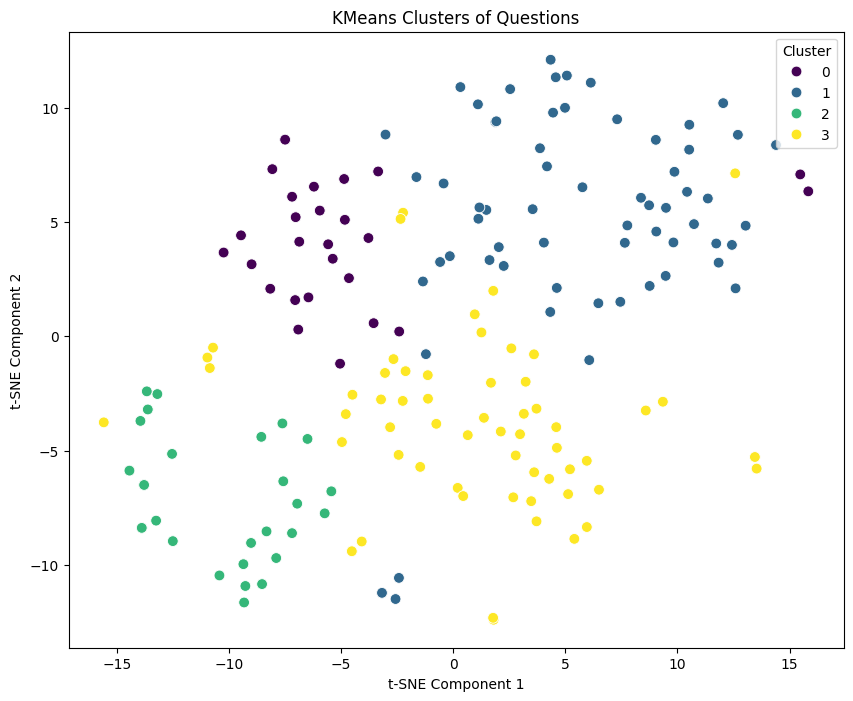

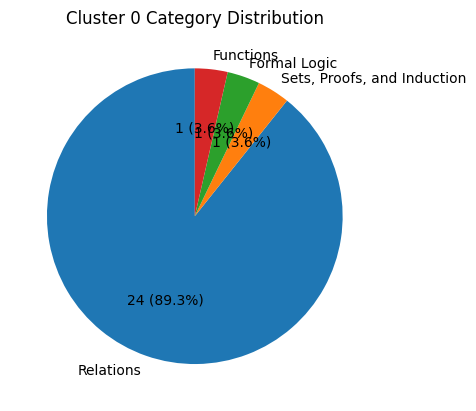

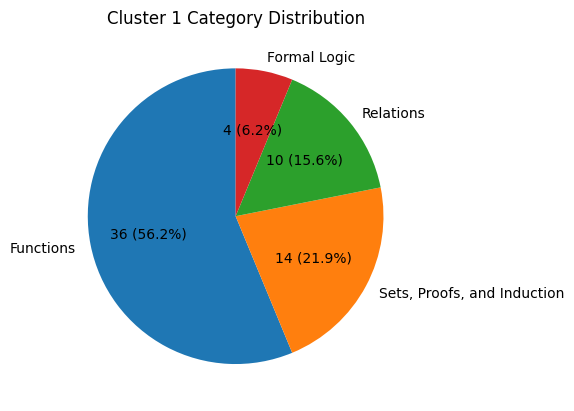

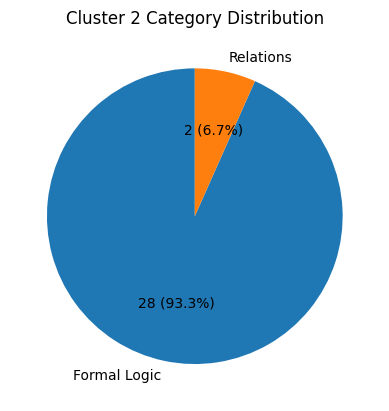

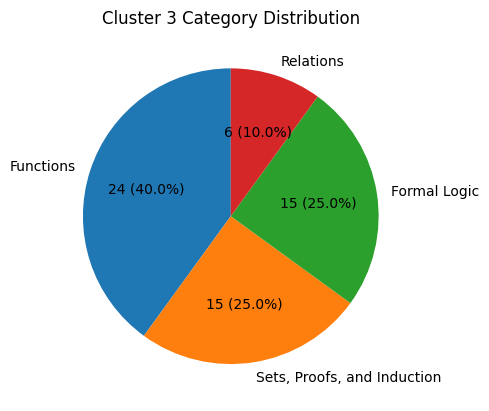

...

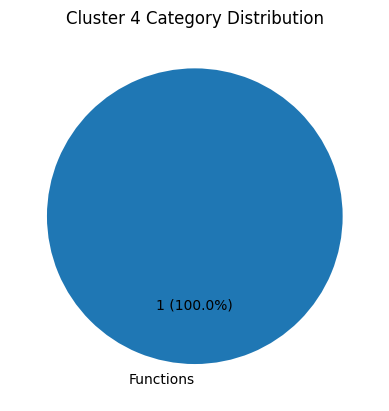

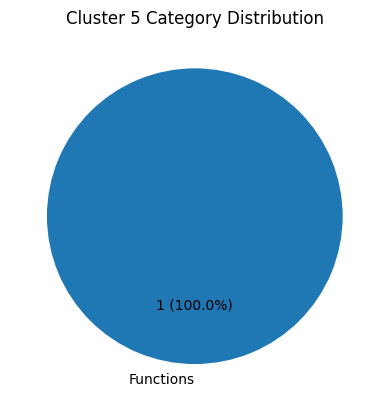

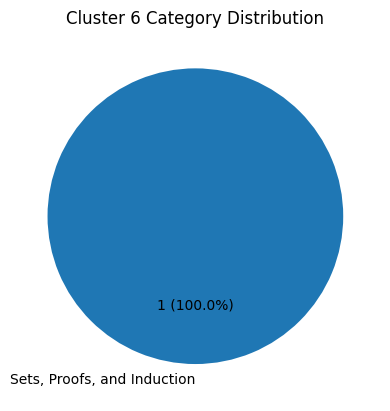

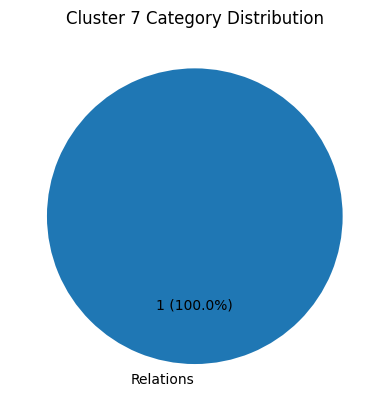

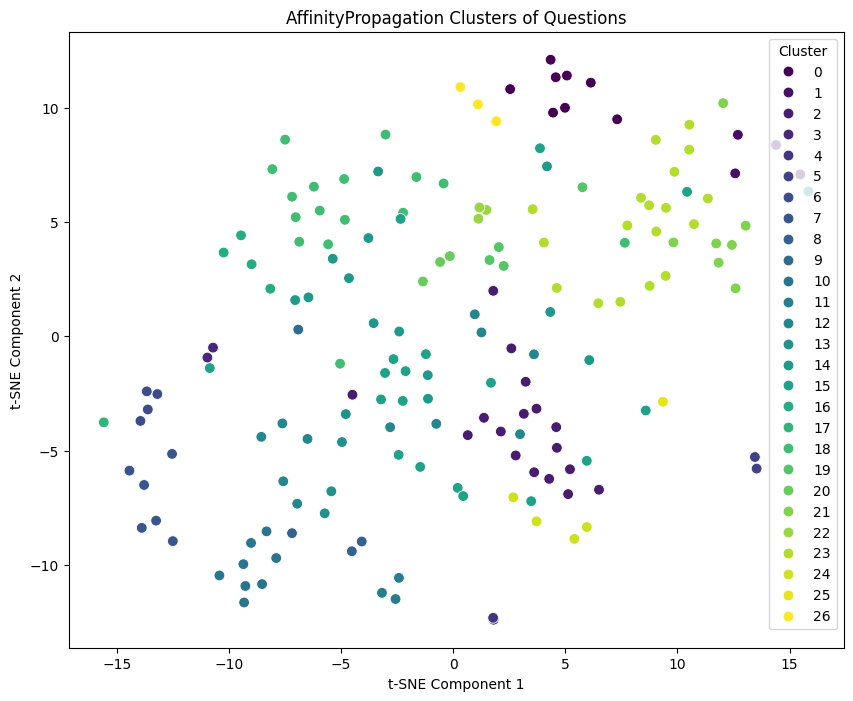

<ipython-input-10-f063238e1095>:39: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


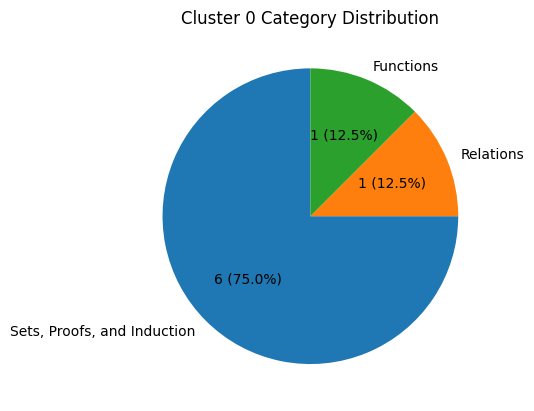

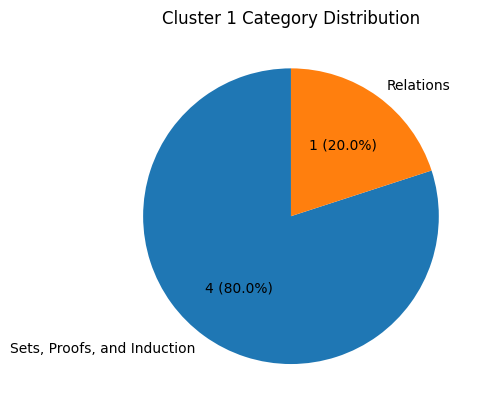

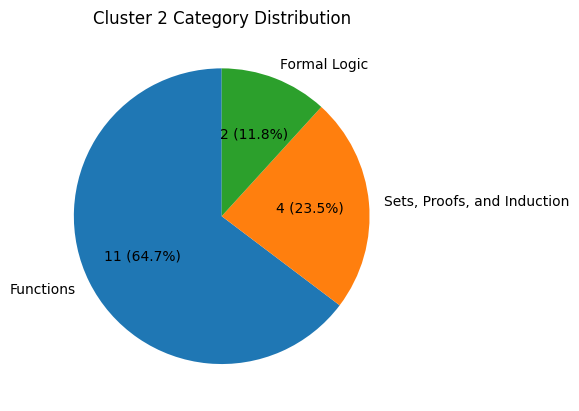

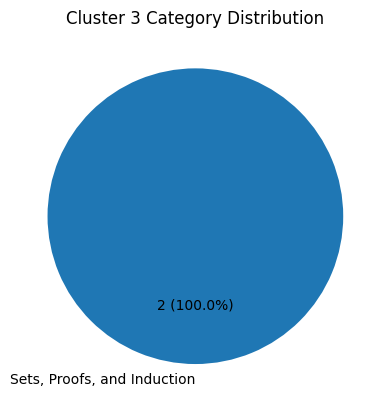

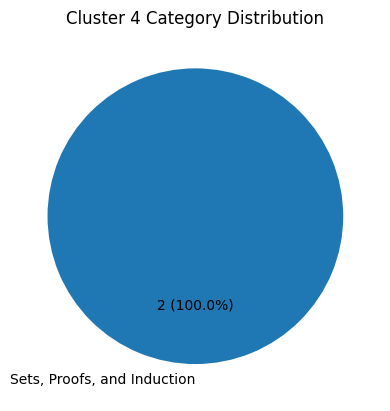

...

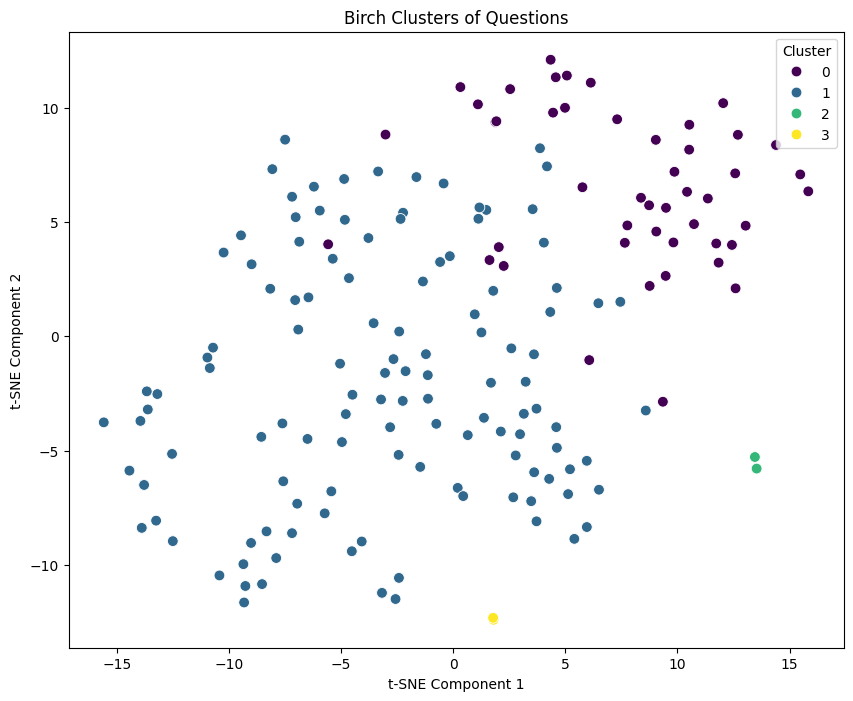

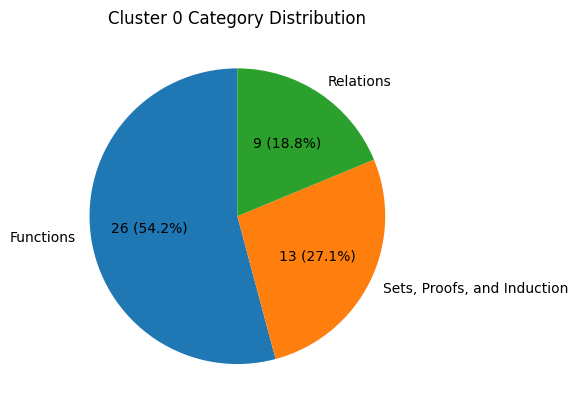

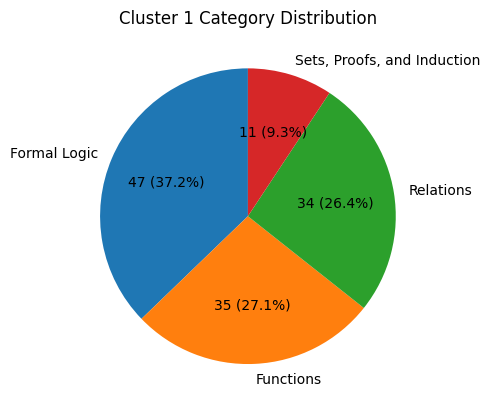

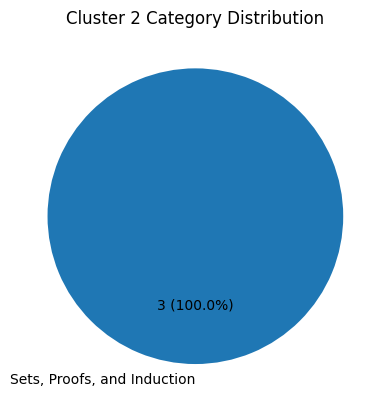

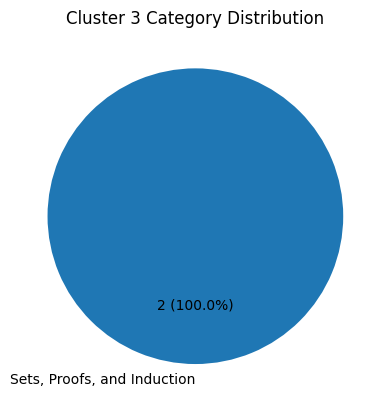

In [ ]:
vectors = vectorize(df["tokenized_question"], pretrained_model)

num_clusters = len(questions.keys())  # Customize as needed
df = cluster_and_visualize(vectors, num_clusters, df)

In [ ]:
plot_categories(df, pretrained_model)

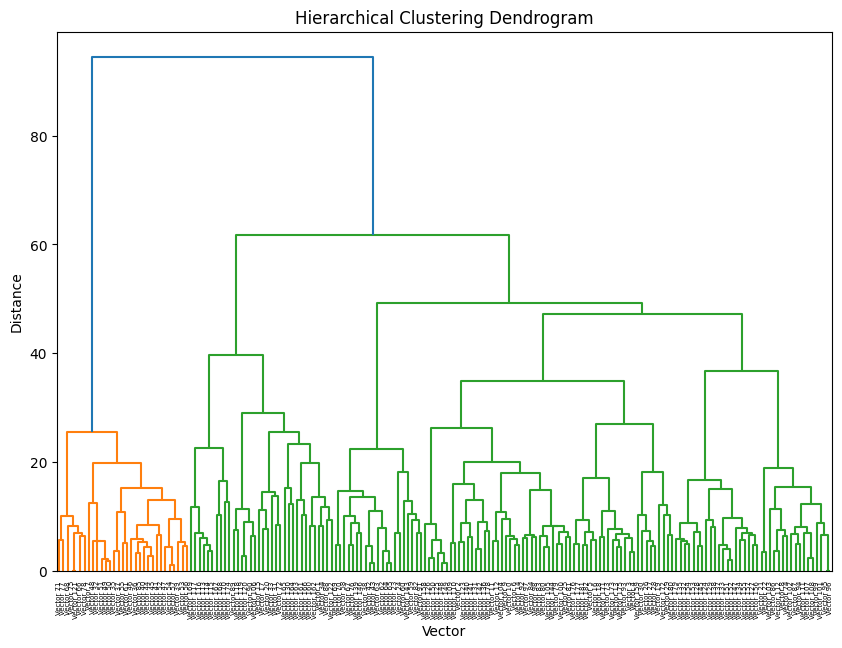

TypeError: 'NoneType' object is not iterable

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
import plotly.figure_factory as ff

Z = linkage(vectors, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z, labels=[f'Vector {i+1}' for i in range(len(vectors))])  # Use len(vectors) for labels
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Vector")
plt.ylabel("Distance")
plt.show()

labels = [f"Vector {i+1}" for i in range(len(vectors))]

# Map labels to the 'original question' column in the DataFrame
label_to_text = {f"Vector {i+1}": df['raw_question'].iloc[i] for i in range(len(df))}

# Correct the number of labels for ff.create_dendrogram
fig = ff.create_dendrogram(Z, labels=[f'Vector {i+1}' for i in range(len(vectors) - 1)], color_threshold=0)  # Use len(vectors) for labels

for i in range(len(fig['data'])):
    # Get hover text using the label_to_text mapping
    fig['data'][i]['hovertext'] = [
        label_to_text.get(label, label) for label in fig['data'][i]['text']
    ]
    fig['data'][i]['hoverinfo'] = "text"  # Show the hover text on hover



# Update layout for better visualization
fig.update_layout(
    title="Interactive Hierarchical Clustering Dendrogram",
    xaxis_title="Vector",
    yaxis_title="Distance",
    width=800,
    height=600
)

# Show the interactive dendrogram
fig.show()

In [ ]:
from gensim.models import Word2Vec

own_model = Word2Vec(
    sentences=df["tokenized_question"],  # Input tokenized documents
    vector_size=100,                     # Dimensionality of word vectors
    window=5,                            # Context window size
    min_count=1,                         # Minimum word frequency
    workers=2,                           # Number of CPU cores
    seed=42                              # Seed for reproducibility
)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_birch.py:725: ConvergenceWarning:

Number of subclusters found (1) by BIRCH is less than (4). Decrease the threshold.



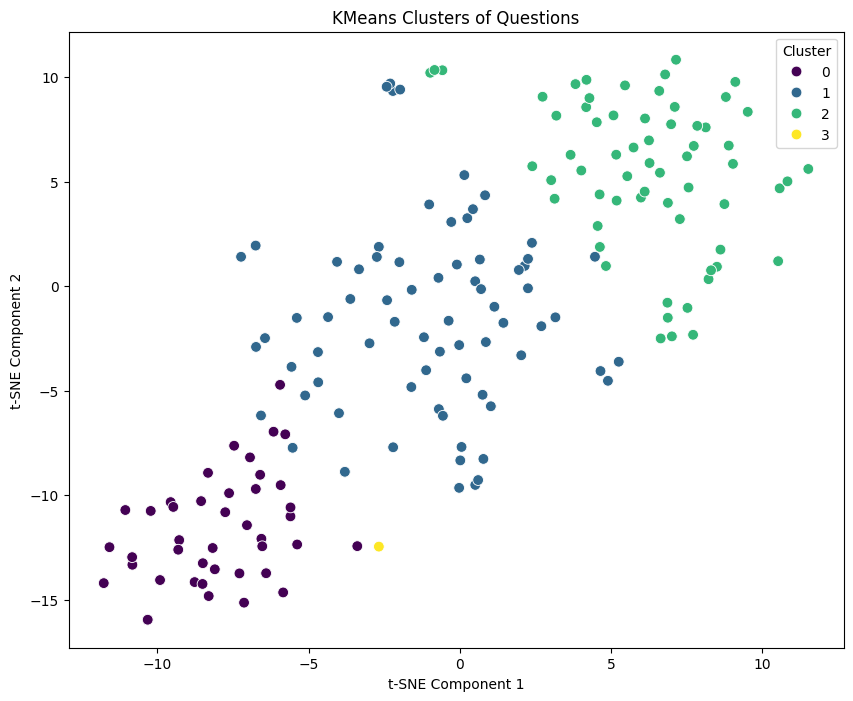

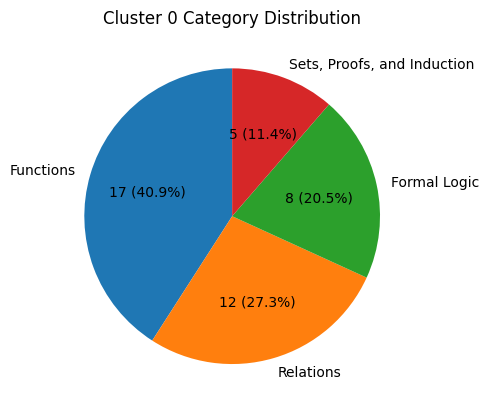

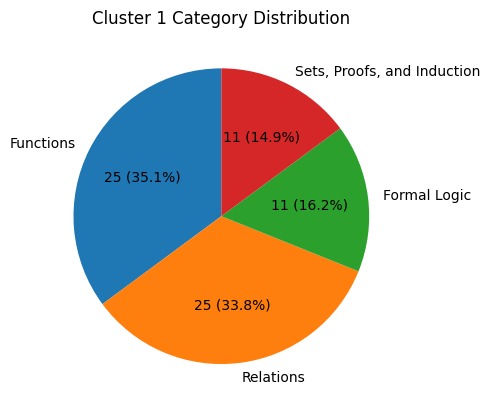

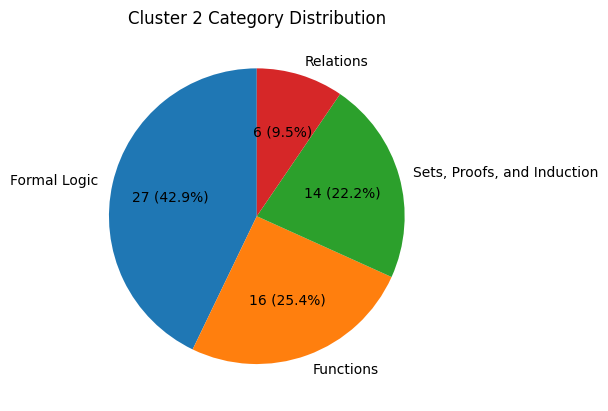

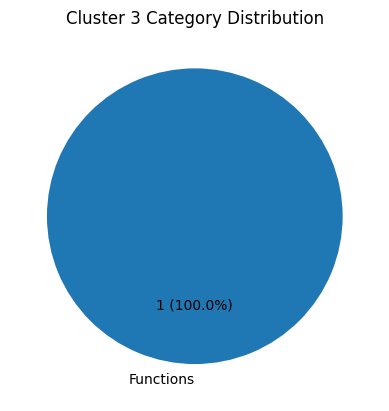

...

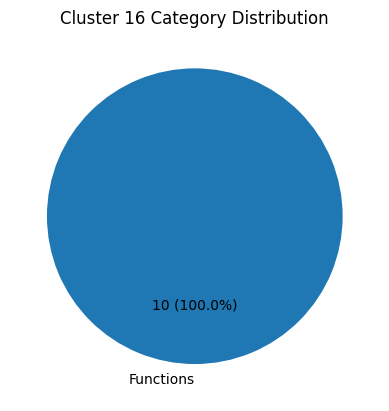

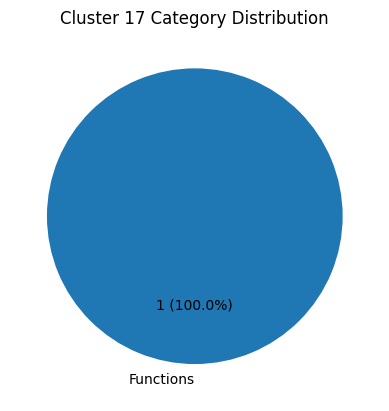

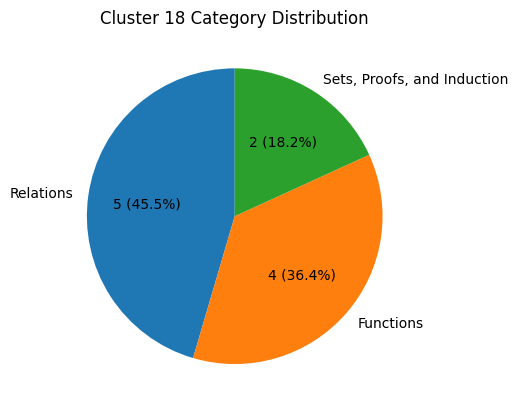

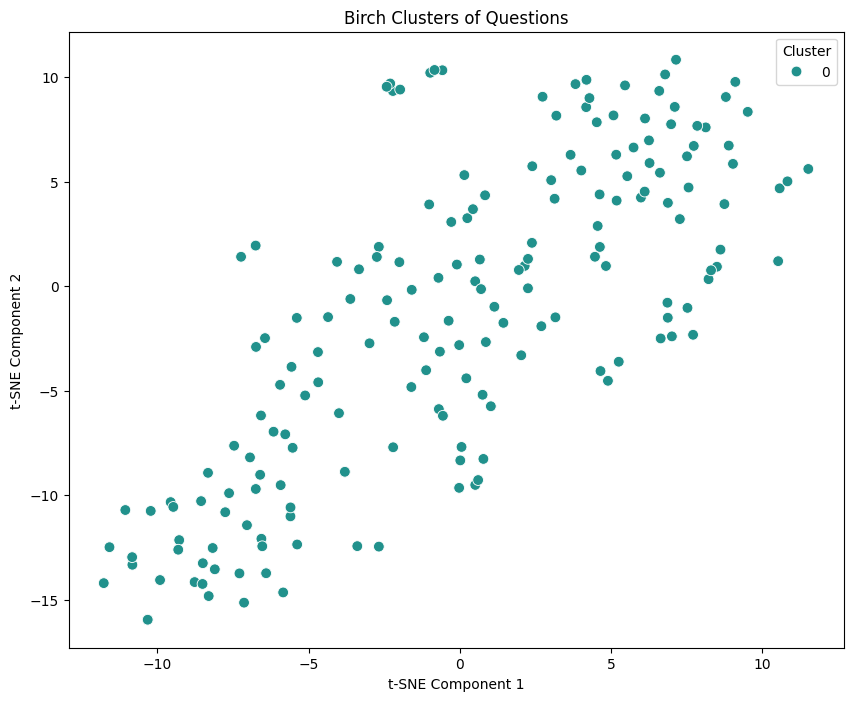

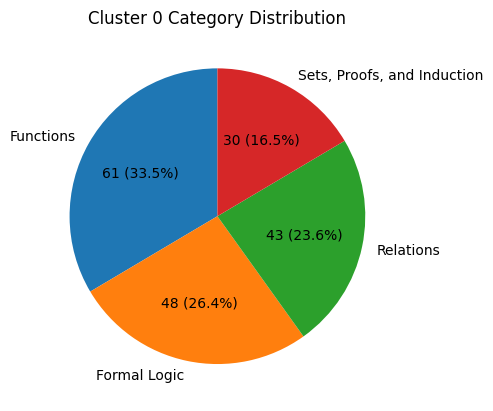

In [ ]:
vectors = vectorize(df["tokenized_question"], own_model)

num_clusters = len(questions.keys())  # Customize as needed
df = cluster_and_visualize(vectors, num_clusters, df)

In [ ]:
plot_categories(df, own_model)

In [ ]:
!pip install sentence-transformers

In [ ]:
from sentence_transformers import SentenceTransformer

embedder = SentenceTransformer("all-MiniLM-L6-v2")


/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:13: TqdmExperimentalWarning:

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning:


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.



modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

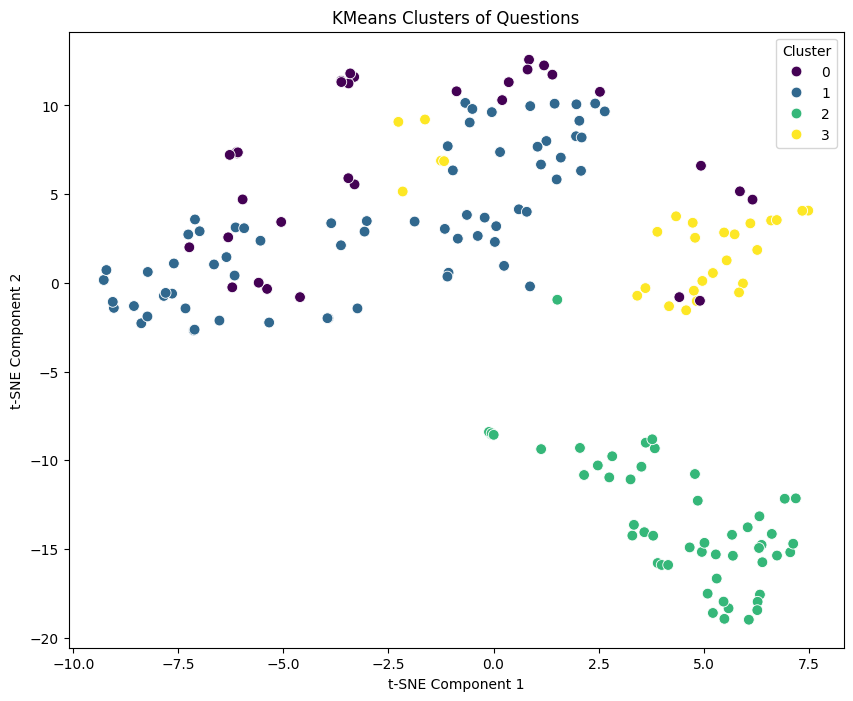

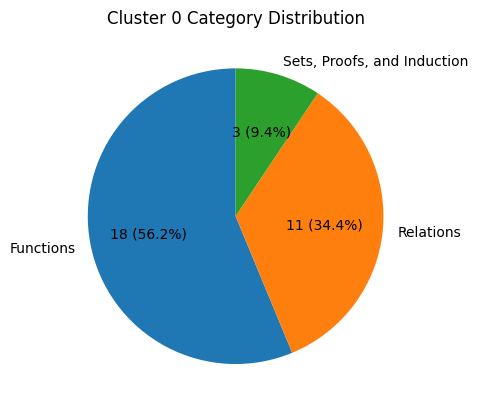

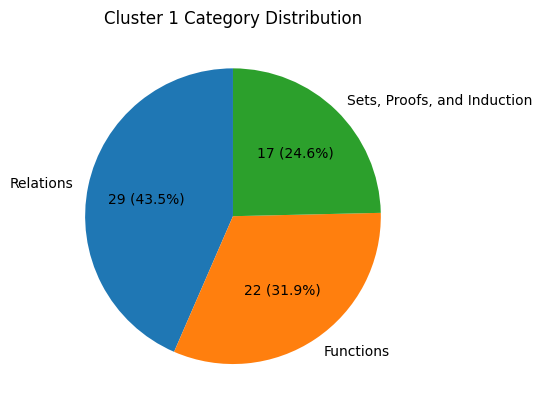

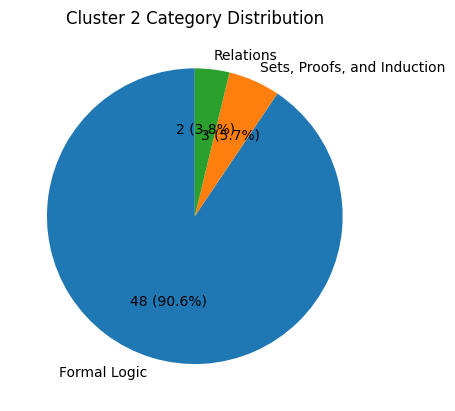

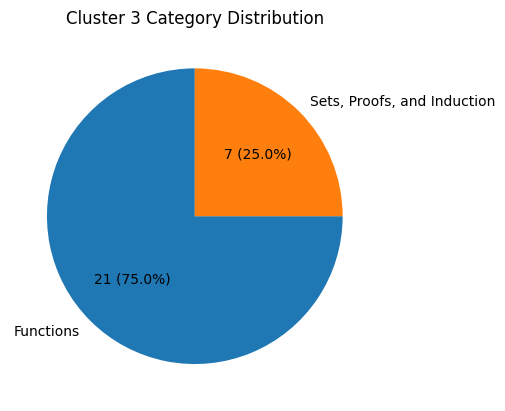

...

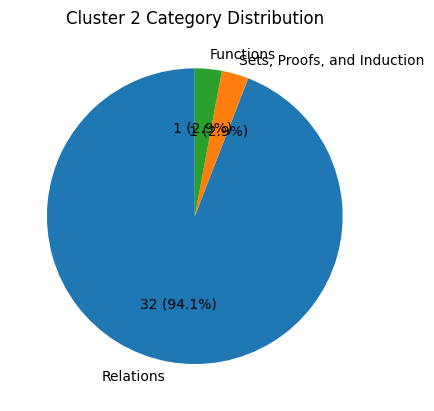

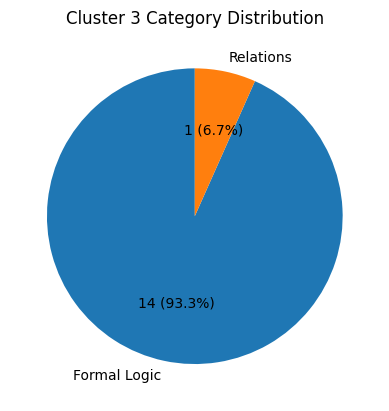

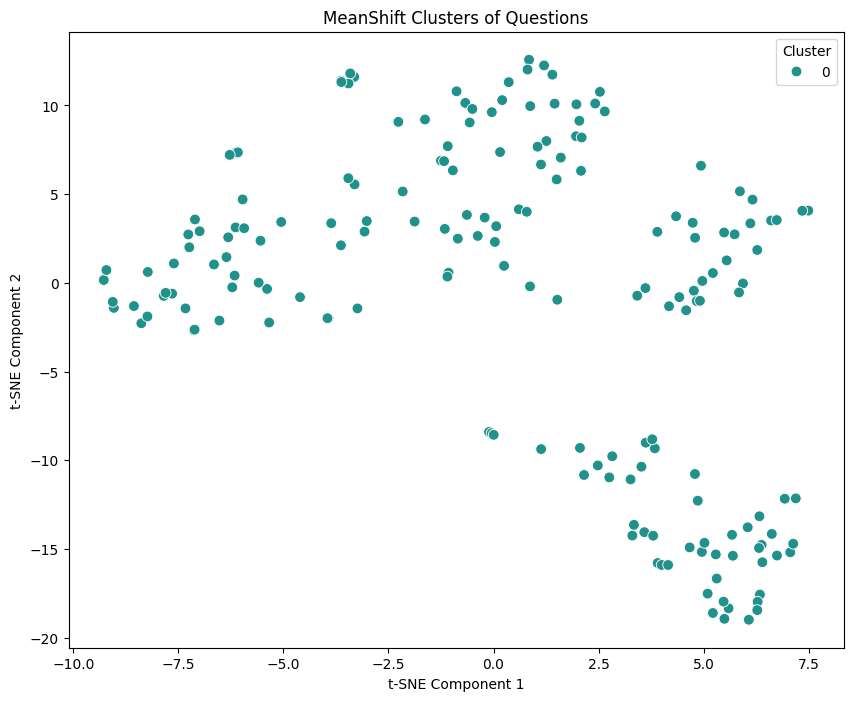

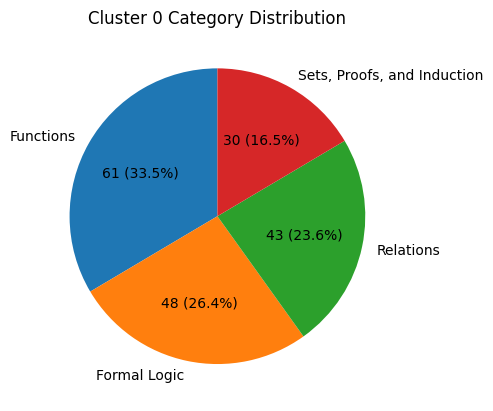

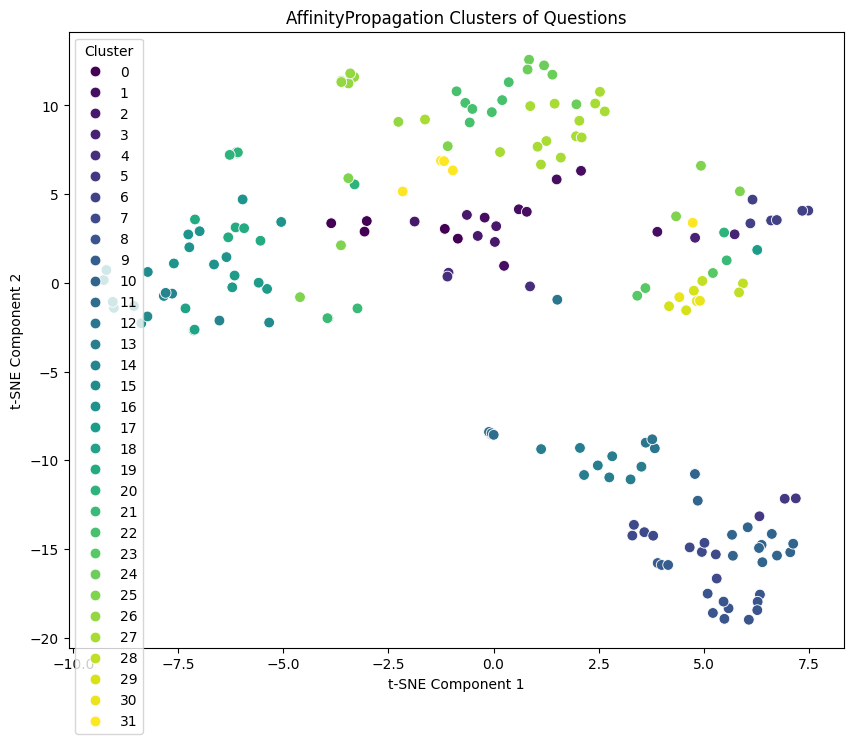

<ipython-input-10-f063238e1095>:39: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



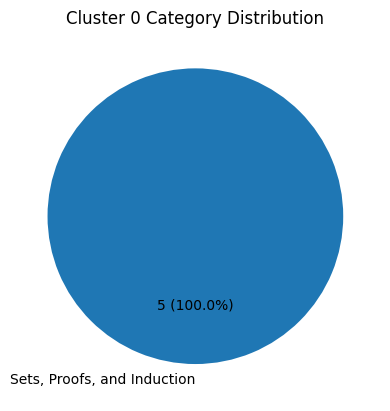

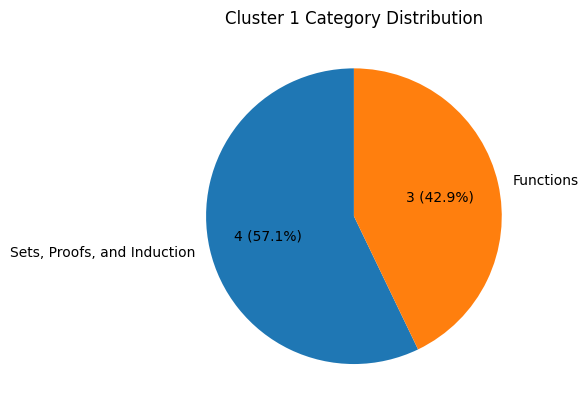

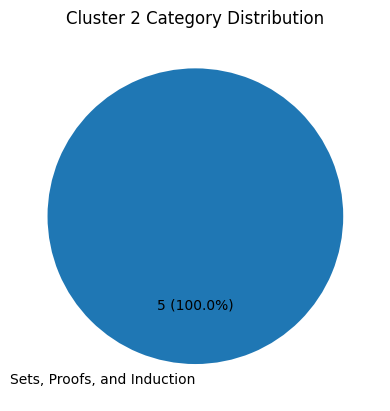

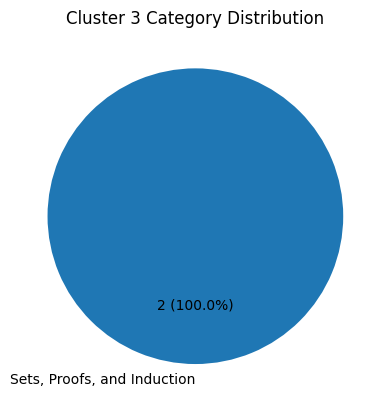

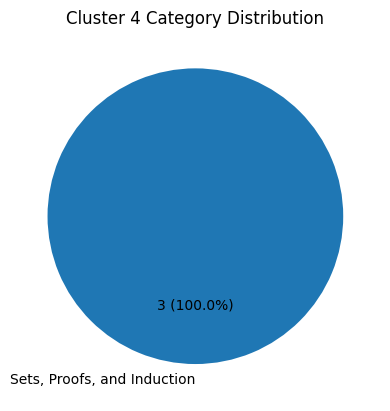

...

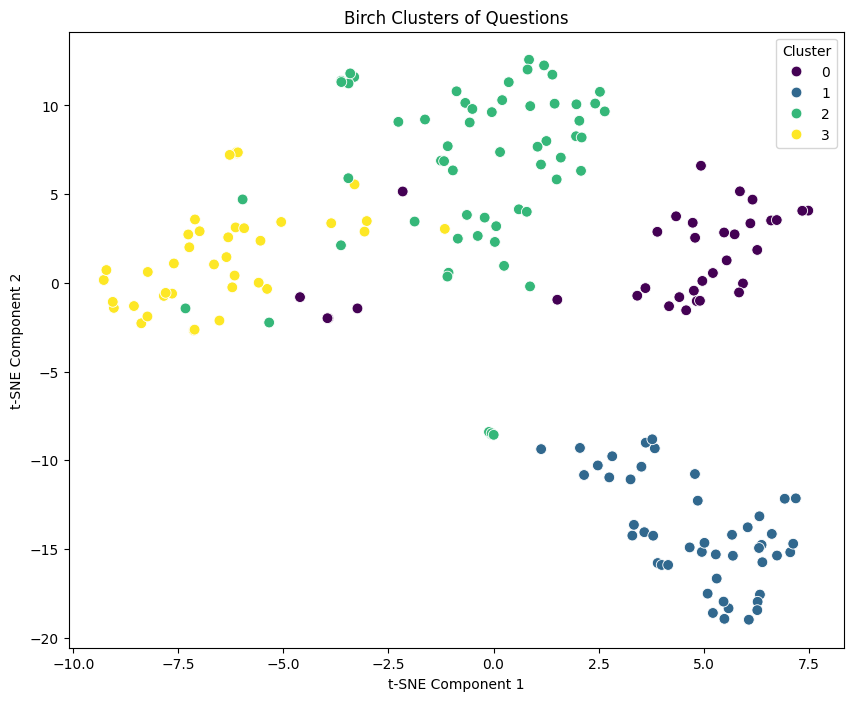

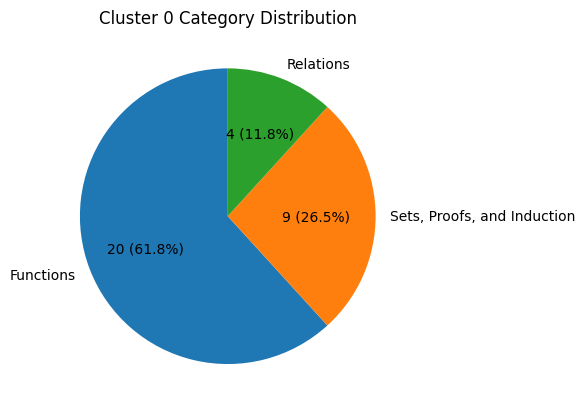

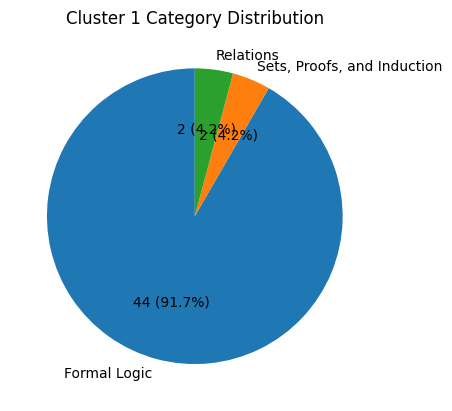

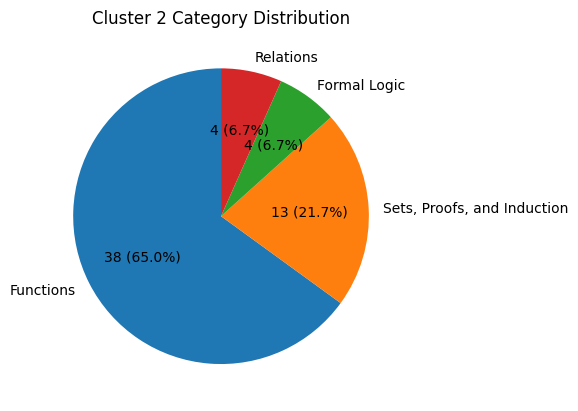

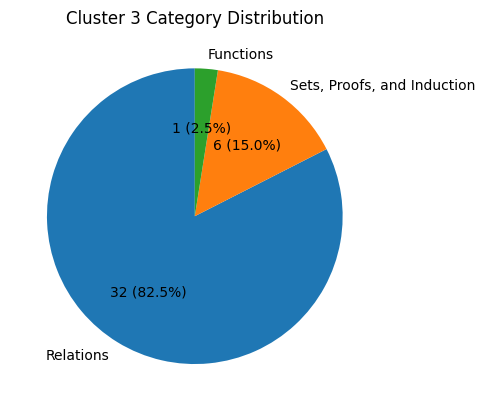

In [ ]:
vectors = embedder.encode(df["raw_question"].tolist())

num_clusters = len(questions.keys())  # Customize as needed
df = cluster_and_visualize(vectors, num_clusters, df)

In [ ]:
X = np.vstack(vectors)

pca = PCA(n_components=10)
X_reduced = pca.fit_transform(X)

tsne = TSNE(n_components=2, random_state=0)
X_2d = tsne.fit_transform(X_reduced)


# Add the 2D coordinates to the DataFrame
df_2d = pd.DataFrame(X_2d, columns=['x', 'y'])
df_2d['category'] = df['category']
df_2d["question"] = df["raw_question"]

fig = px.scatter(df_2d, x='x', y='y', color='category', hover_data=['question'])
fig.show()

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/118 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/5.57k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/676 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/366 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

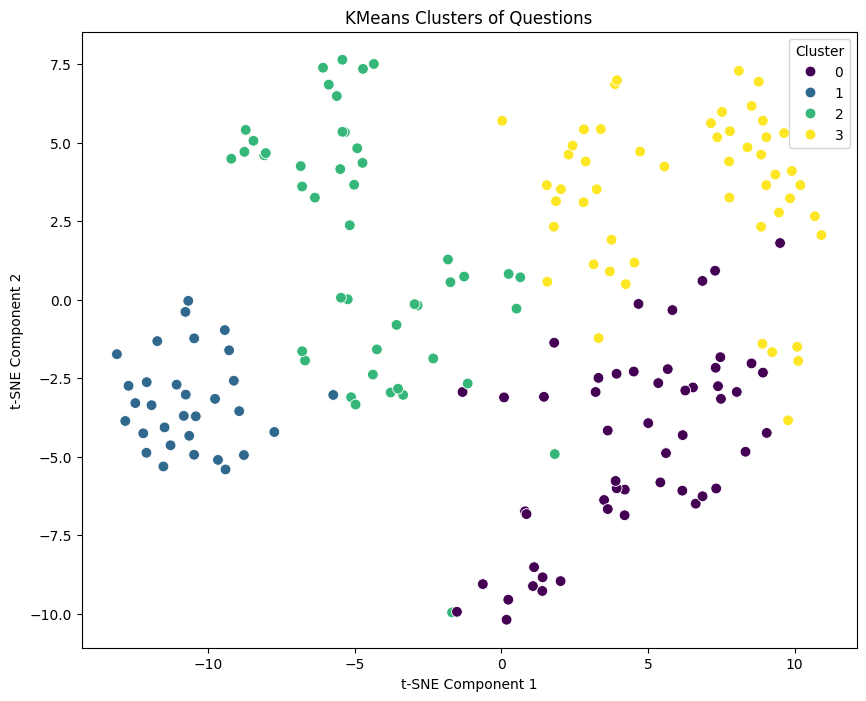

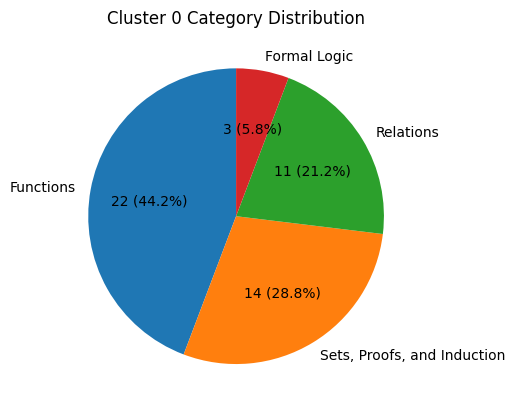

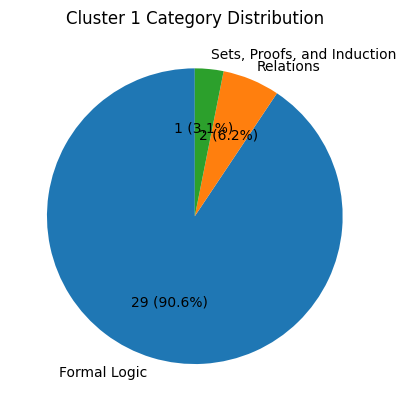

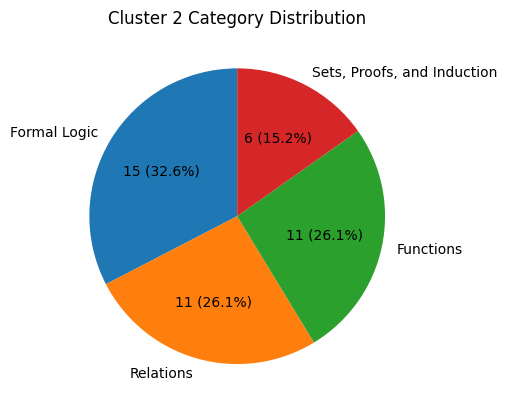

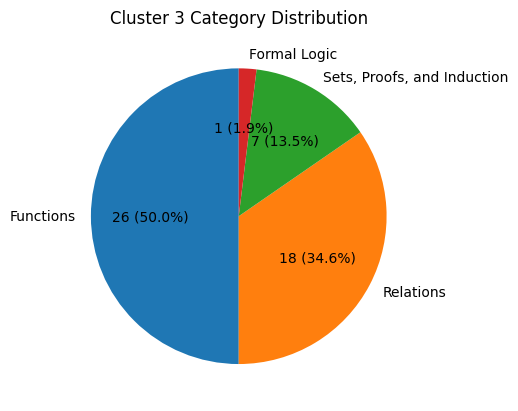

...

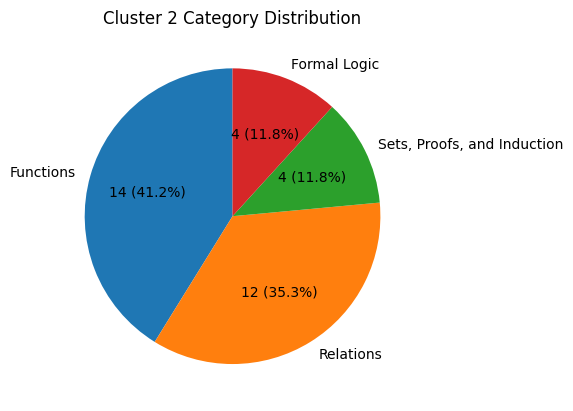

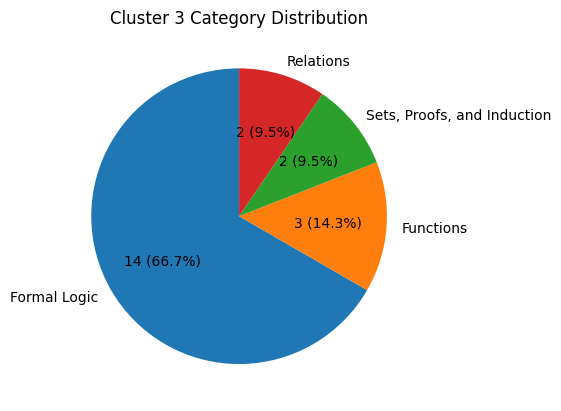

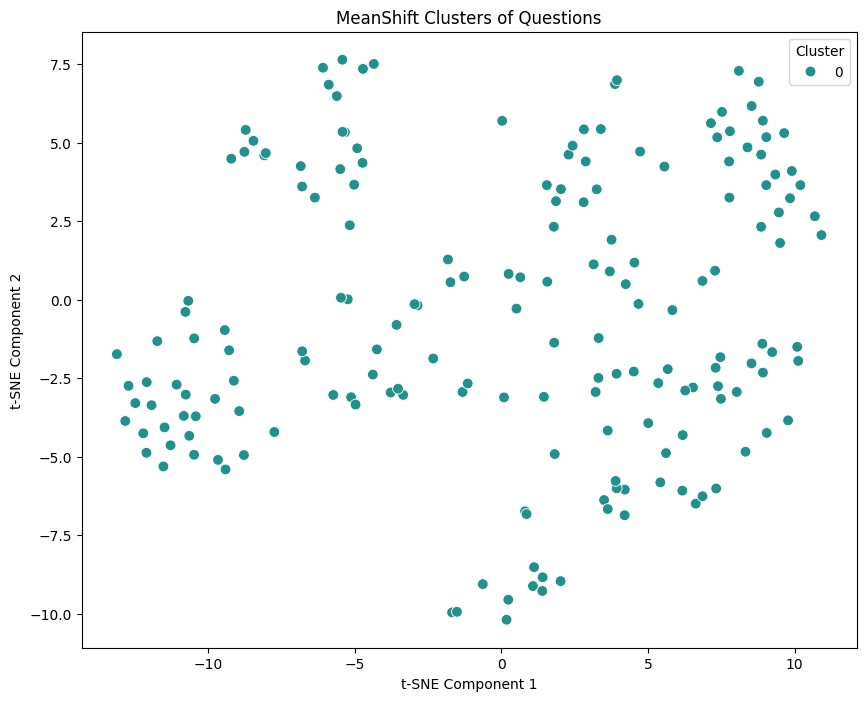

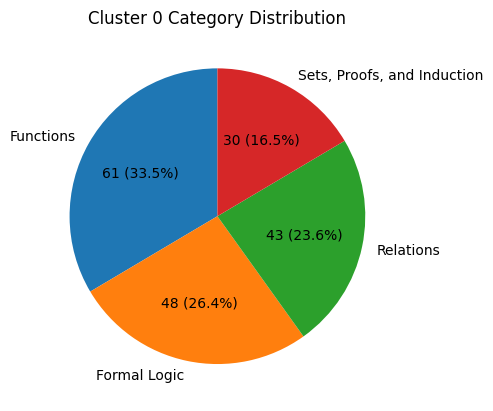

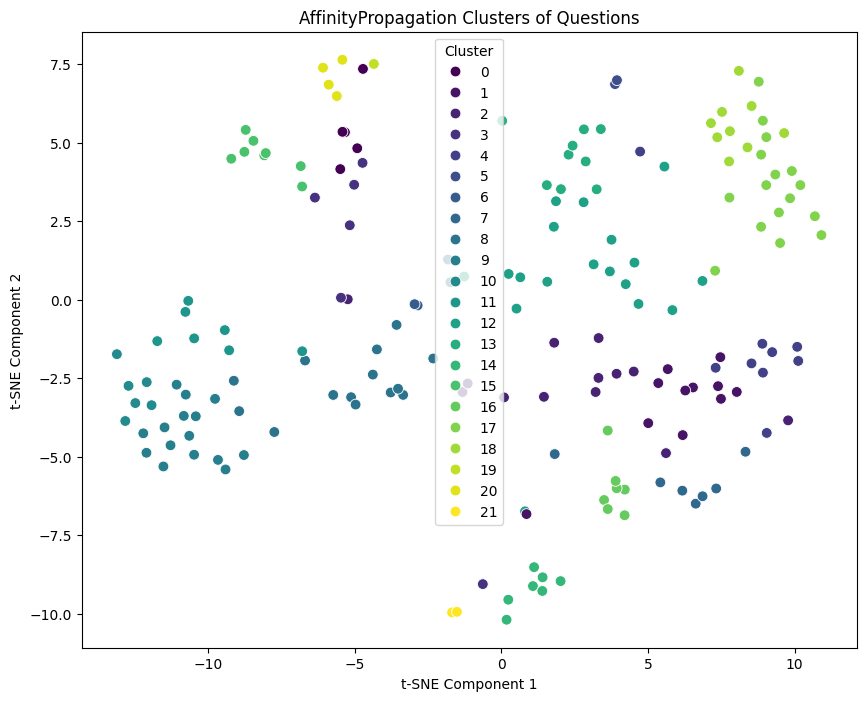

<ipython-input-10-f063238e1095>:39: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



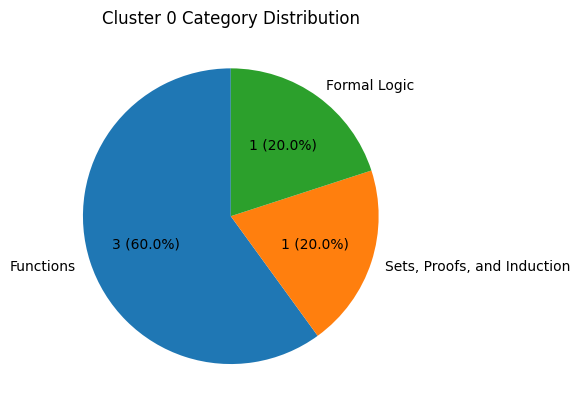

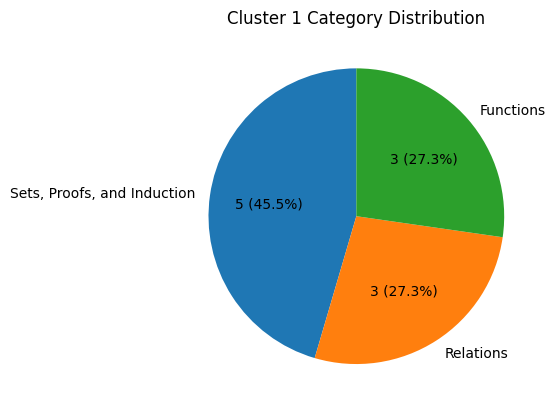

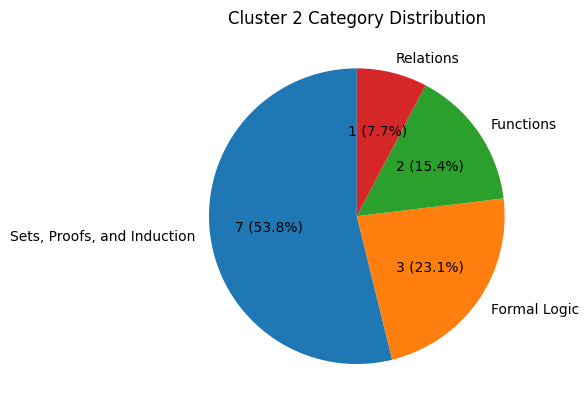

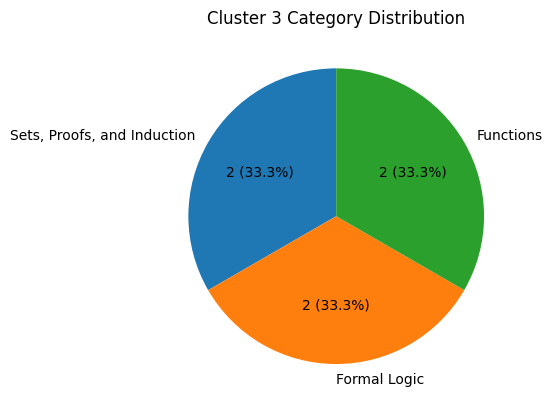

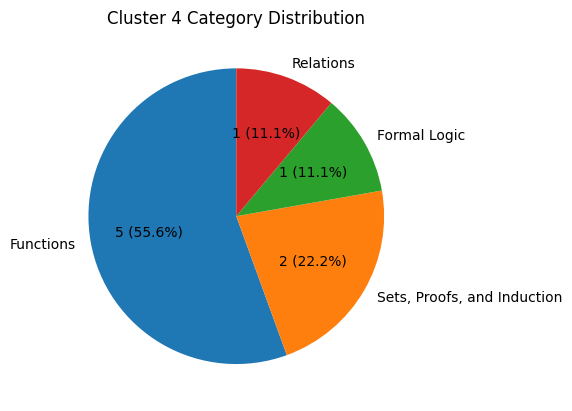

...

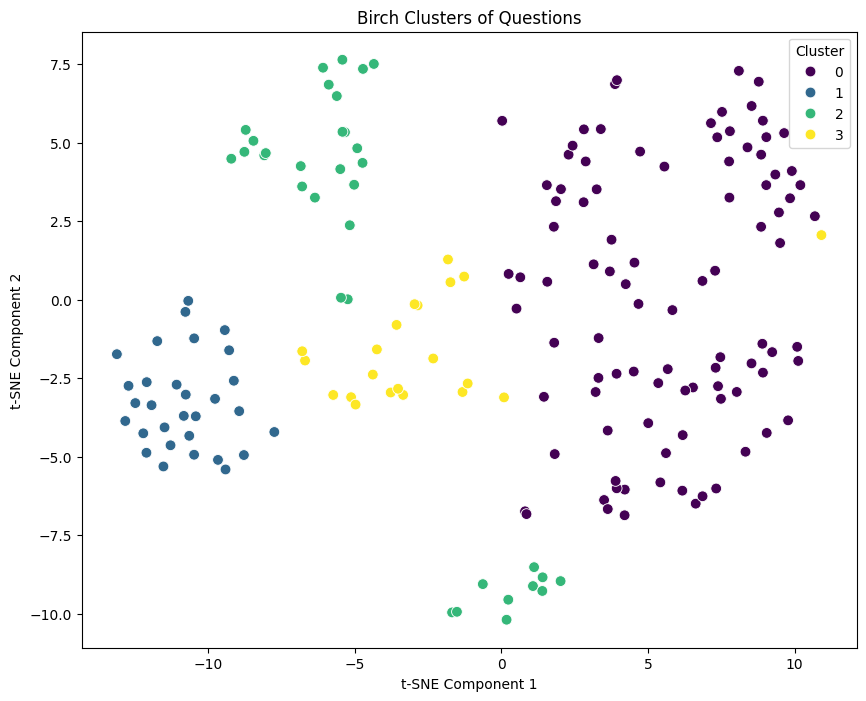

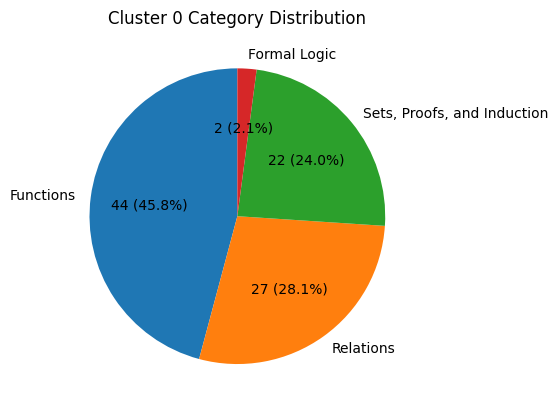

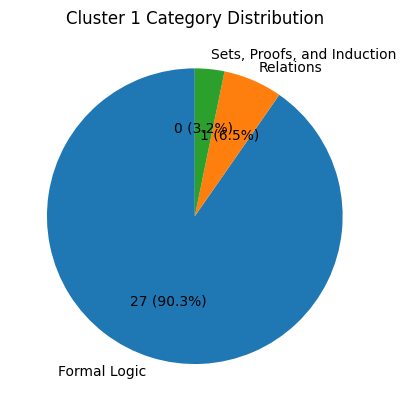

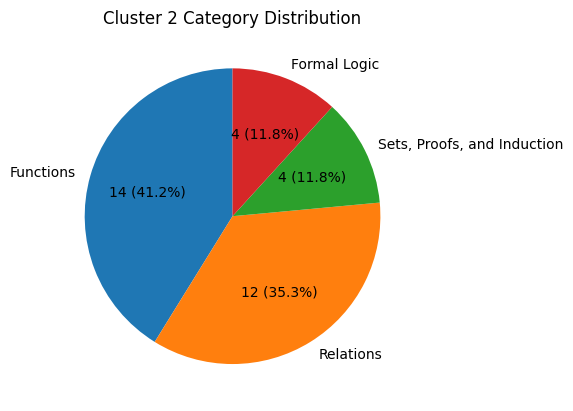

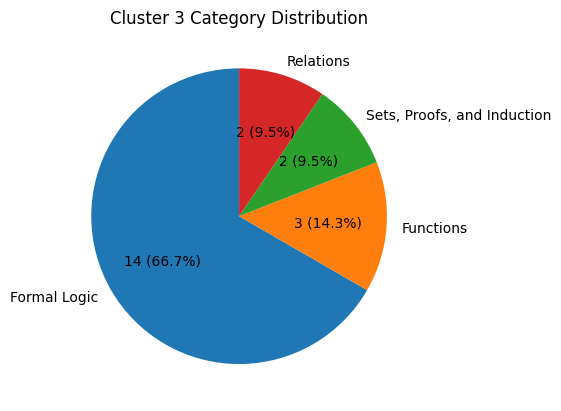

In [ ]:
model = SentenceTransformer('math-similarity/Bert-MLM_arXiv-MP-class_zbMath')

vectors = model.encode(df["raw_question"].tolist())

num_clusters = len(questions.keys())  # Customize as needed
df = cluster_and_visualize(vectors, num_clusters, df)


In [ ]:
X = np.vstack(vectors)

pca = PCA(n_components=10)
X_reduced = pca.fit_transform(X)

tsne = TSNE(n_components=2, random_state=0)
X_2d = tsne.fit_transform(X_reduced)


# Add the 2D coordinates to the DataFrame
df_2d = pd.DataFrame(X_2d, columns=['x', 'y'])
df_2d['category'] = df['category']
df_2d["question"] = df["raw_question"]

fig = px.scatter(df_2d, x='x', y='y', color='category', hover_data=['question'])
fig.show()